In [119]:
import sys

sys.path.append('..')

In [120]:
from glob import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from midasfpga.utils.infer_utils import compute_scale_and_shift
import torch
import torch.nn.functional as F

In [121]:
cpu_disparity_paths = sorted(glob("../inference_results/cpu_disparity/*.npy"))
dpu_disparity_paths = [f.replace('cpu', 'dpu') for f in cpu_disparity_paths]
gt_depth_paths = [f.replace('inference_results/cpu_disparity/cpu_disp_', 'data/depth_') for f in cpu_disparity_paths]
image_paths = [f.replace('depth', 'rgb').replace('npy', 'png') for f in gt_depth_paths]
cpu_disparity = [np.load(f) for f in cpu_disparity_paths]
dpu_disparity = [np.load(f) for f in dpu_disparity_paths]
gt_depth = [np.load(f) for f in gt_depth_paths]
image = [cv2.cvtColor(cv2.imread(f), cv2.COLOR_BGR2RGB) for f in image_paths]
masks = [(d>0)*(d<10) for d in gt_depth]

In [122]:
def align(dpth, cdisp, mask):
    mask = torch.tensor(mask).unsqueeze(0)
    target_depth = torch.tensor(dpth).to(torch.float32).unsqueeze(0)
    prediction = torch.tensor(cdisp).to(torch.float32).unsqueeze(0)
    prediction = F.interpolate(
        prediction.unsqueeze(0),
        size=mask.shape[1:],
        mode="bilinear",
        align_corners=False,
    )
    prediction = prediction.squeeze(1)
    target_disparity = torch.zeros_like(target_depth)
    target_disparity[mask == 1] = 1.0 / target_depth[mask == 1]

    scale, shift = compute_scale_and_shift(prediction, target_disparity, mask)
    target_aligned = (target_disparity - shift) / scale
    gtdisp, preddisp = target_aligned.squeeze().numpy(), prediction.squeeze().numpy()
    mask = mask.squeeze().numpy()
    gtdisp[mask==0] = preddisp[mask==0]
    return gtdisp, preddisp

def viz(img, dpth, mask, ddisp, cdisp):
    return (img,) + align(dpth, cdisp, mask)  + (align(dpth, ddisp, mask)[1],) 

def getall(image, gt_depth, masks, cpu_disparity, dpu_disparity):
    return [viz(image[i], gt_depth[i], masks[i], dpu_disparity[i], cpu_disparity[i]) for i in range(len(image))]

In [123]:
results = getall(image, gt_depth, masks, cpu_disparity, dpu_disparity)

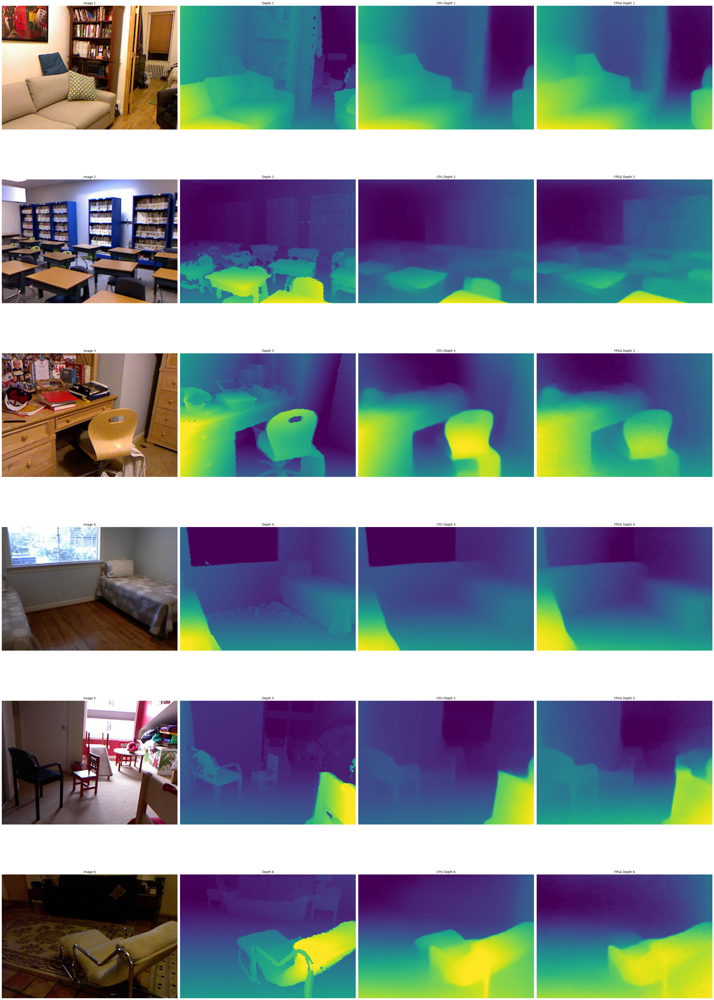

In [124]:
rows = 6
cols = 4

def clip_image(image, clip_size=50):
    return image[clip_size:-clip_size, clip_size:-clip_size]


# Initialize the figure
fig, axes = plt.subplots(rows, cols, figsize=(40, 60))

# Loop through each row
for i in range(rows):
    # Load the images
    image = results[i][0]
    depth = results[i][1]

    cpu_depth = results[i][2]
    fpga_depth = results[i][3]


    # Find the common min and max for this row
    percentile_min = 2
    percentile_max = 98
    
    vmin = np.percentile(depth, percentile_min)
    vmax = np.percentile(depth, percentile_max)
    depth = np.clip(depth, vmin, vmax)
        
    vmin = np.percentile(cpu_depth, percentile_min)
    vmax = np.percentile(cpu_depth, percentile_max)
    cpu_depth = np.clip(cpu_depth, vmin, vmax)

    vmin = np.percentile(fpga_depth, percentile_min)
    vmax = np.percentile(fpga_depth, percentile_max)
    fpga_depth = np.clip(fpga_depth, vmin, vmax)


    image = clip_image(image)  
    depth = clip_image(depth) 
    cpu_depth = clip_image(cpu_depth)
    fpga_depth = clip_image(fpga_depth) 

    # Display the images
    axes[i, 0].imshow(image)
    axes[i, 0].set_title(f'Image {i+1}')
    axes[i, 0].axis('off')
    
    im1 = axes[i, 1].imshow(depth, cmap='viridis')
    axes[i, 1].set_title(f'Depth {i+1}')
    axes[i, 1].axis('off')

    im2 = axes[i, 2].imshow(cpu_depth, cmap='viridis')
    axes[i, 2].set_title(f'CPU Depth {i+1}')
    axes[i, 2].axis('off')
    
    im3 = axes[i, 3].imshow(fpga_depth, cmap='viridis')
    axes[i, 3].set_title(f'FPGA Depth {i+1}')
    axes[i, 3].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()